# 🚨¡**Es hora de transformarse**! 🚨

⚠️ Ten en cuenta que para poder ejecutar la mayoría de pasos de este cuaderno, necesitarás tener un lakehouse agregado a él. Para ello, puedes seguir [los pasos indicados aquí](https://learn.microsoft.com/es-es/fabric/data-engineering/lakehouse-notebook-explore).

Recuerda que dispones del fichero **census_income.csv** dentro de la ruta de GitHub.

# 1. Los datos, nuestra moneda de poder 🪙

Lo primero que necesitamos para ejecutar el Data Wrangler, es cargar en el entorno de ejecución el **DataFrame** que queremos procesar. Para ello, podemos usar tanto la librería 🐼**Pandas**🐼 como 💥**Pyspark**💥.

## 1.1 🐼**Pandas**🐼

Si optamos por ***Pandas***, al ser un archivo csv, emplearemos el método **read_csv()**, este necesita que le pasemos la ruta *File API path* del archivo. En este método, podemos llegar a indicar el tipo de separador de columnas y el punto decimal que emplee el archivo. Una de las ventajas de este método es que inferirá automáticamente el tipo de cada columna. La función **display()** nos mostrará por pantalla las primeras 1.000 filas del DataFrame cargado. Adicionalmente, nos ofrece opciones para realizar algun gráfico directamente o descargar los datos.

In [9]:
import pandas as pd
# Load data into pandas DataFrame from "/lakehouse/default/Files/census_income.csv"
df_pandas = pd.read_csv("/lakehouse/default/Files/census_income.csv")
display(df_pandas)

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 11, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, ad59681d-069e-4c87-b1e1-7d921e84a752)

Además de la función **display()**, podemos usar el método clásico de Pandas **head(*N*)** para visualizar por pantalla las primeras *N* filas, por defecto 5. Si quisiésemos visualizar las *N* últimas, emplearíamos método **tail(*N*)**.

In [10]:
df_pandas.head()

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 12, Finished, Available, Finished)

,citizen_id,age,workclass,education,education-num,marital-status,marital_event_date,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,677517,39,State-gov,Bachelors,13,Never-married,2999-12-31,Adm-clerical,Not-in-family,White,Male,2174,0,NaN,United-States
1,686116,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,1954-04-05,Exec-managerial,Husband,White,Male,0,0,NaN,United-States
2,775628,38,Private,HS-grad,9,Divorced,1988-09-07,Handlers-cleaners,Not-in-family,White,Male,0,0,NaN,United-States
3,293596,53,Private,11th,7,Married-civ-spouse,1945-01-16,Handlers-cleaners,Husband,Black,Male,0,0,40.0,United-States
4,201657,28,Private,Bachelors,13,Married-civ-spouse,1949-09-04,Prof-specialty,Wife,Black,Female,0,0,40.0,Cuba


Podemos imprimir por pantalla el listado de columnas y su tipo a través del atributo **dtypes**.

In [11]:
df_pandas.dtypes

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 13, Finished, Available, Finished)

citizen_id              int64
age                     int64
workclass              object
education              object
education-num           int64
marital-status         object
marital_event_date     object
occupation             object
relationship           object
race                   object
sex                    object
capital-gain            int64
capital-loss            int64
hours-per-week        float64
native-country         object
dtype: object

También podemos acceder al número total de filas y columnas mediante el atriputo **shape**. Este nos devuelve un tupla donde el primer elemento es el número de filas y el sengudo el número de columnas. Otra opción para calcular el número de filas es emplear la función **len()**.

In [12]:
print("Número de filas y columnas:", df_pandas.shape)
print("Número de filas:", df_pandas.shape[0])
print("Número de columnas:", df_pandas.shape[1])
print("Número de filas:", len(df_pandas))

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 14, Finished, Available, Finished)

Número de filas y columnas: (48842, 15)
Número de filas: 48842
Número de columnas: 15
Número de filas: 48842


Para imprimir más información sobre el conjunto de datos, podemos usar el método **info()**. Este imprimirá por pantalla información general sobre el DataFrame como el número de registros, el listado de columnas con sus respectivos tipos y número de registros no nulos de cada una.

In [13]:
df_pandas.info()

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 15, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   citizen_id          48842 non-null  int64  
 1   age                 48842 non-null  int64  
 2   workclass           46043 non-null  object 
 3   education           48842 non-null  object 
 4   education-num       48842 non-null  int64  
 5   marital-status      48842 non-null  object 
 6   marital_event_date  48842 non-null  object 
 7   occupation          46033 non-null  object 
 8   relationship        48842 non-null  object 
 9   race                48842 non-null  object 
 10  sex                 48842 non-null  object 
 11  capital-gain        48842 non-null  int64  
 12  capital-loss        48842 non-null  int64  
 13  hours-per-week      38000 non-null  float64
 14  native-country      47985 non-null  object 
dtypes: float64(1), int64(5), object(9)
memory usage: 5.6+

Por último, el método **describe()** muestra las características estadísticas básicas de cada característica numérica (tipos int64 y float64): número de valores no perdidos, media, desviación estándar, rango, mediana, cuartiles de 0,25 y 0,75.



In [18]:
df_pandas.describe()

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 20, Finished, Available, Finished)

,citizen_id,age,education-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,48842.000000,48842.000000,48842.000000,48842.000000,38000.000000
mean,548883.294726,38.643585,10.078089,1079.067626,87.502314,40.425263
std,260360.565436,13.710510,2.570973,7452.019058,403.004552,12.394778
min,100012.000000,17.000000,1.000000,0.000000,0.000000,1.000000
25%,324202.000000,28.000000,9.000000,0.000000,0.000000,40.000000
50%,546950.000000,37.000000,10.000000,0.000000,0.000000,40.000000
75%,774266.250000,48.000000,12.000000,0.000000,0.000000,45.000000
max,999964.000000,90.000000,16.000000,99999.000000,4356.000000,99.000000


Si especificamos el argumento **include='all'** en el método anterior, se incluirá en la salida información de las columnas no numéricas: número de valores únicos, moda y número de registros del valor más frecuente.

In [19]:
df_pandas.describe(include='all')

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 21, Finished, Available, Finished)

,citizen_id,age,workclass,education,education-num,marital-status,marital_event_date,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
count,48842.000000,48842.000000,46043,48842,48842.000000,48842,48842,46033,48842,48842,48842,48842.000000,48842.000000,38000.000000,47985
unique,NaN,NaN,8,16,NaN,7,20669,14,6,5,2,NaN,NaN,NaN,41
top,NaN,NaN,Private,HS-grad,NaN,Married-civ-spouse,2999-12-31,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States
freq,NaN,NaN,33906,15784,NaN,22379,16117,6172,19716,41762,32650,NaN,NaN,NaN,43832
mean,548883.294726,38.643585,NaN,NaN,10.078089,NaN,NaN,NaN,NaN,NaN,NaN,1079.067626,87.502314,40.425263,NaN
std,260360.565436,13.710510,NaN,NaN,2.570973,NaN,NaN,NaN,NaN,NaN,NaN,7452.019058,403.004552,12.394778,NaN
min,100012.000000,17.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN
25%,324202.000000,28.000000,NaN,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN
50%,546950.000000,37.000000,NaN,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN
75%,774266.250000,48.000000,NaN,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN


## 1.2 💥**PySpark**💥

Si elegimos ***PySpark***, haremos uso de la función  **spark.read**, donde indicamos en la opción **format()** que queremos leer un archivo csv. En **option()**  podemos configurar distintos parámetros de lectura como si el archivo posee cabecera o no. Por último, en **load()** indicaremos la ruta del archivo, en este caso el *relative path for Spark* de nuestro lakehouse.

In [20]:
df_pyspark = spark.read.format("csv").option("header","true").load("Files/census_income.csv")
# df now is a Spark DataFrame containing CSV data from "Files/census_income.csv".
display(df_pyspark)

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 22, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 524b2869-5130-4a77-bc3d-64d33e33416f)

Si nos fijamos atentamente en la salida anterior, todas las columnas son de tipo *string*. Pyspark por defecto, a diferencia de Pandas, no infiere el tipo de cada columna de manera predeterminada en los archivos csv, para hacerlo, necesitamos especificar en la función la opción **inferSchema** a **true** como se muestra a continuación.

In [21]:
df_pyspark = spark.read.format("csv").option("header","true").option("inferSchema" , "true").load("Files/census_income.csv")
# df now is a Spark DataFrame containing CSV data from "Files/census_income.csv".
display(df_pyspark)

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 23, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 70cfb888-39e8-4fc9-a072-431e9ce3e4fa)

¡Lo tenemos! Otra opción más avanzada, y la recomendada a niveles de rendimiento, es especificar nosotros el esquema de las columnas mediante los tipos de Pyspark y pasarselo a la función en el apartado **schema**. 

In [22]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, DateType, DoubleType

# Cada campo lo tenemos que especificar con el tipo StructField indicando:
#   1º - Nombre de columna
#   2º - Tipo de pyspark.sql.types
#   3º - Si el campo admite valores nulos o no

schema = StructType([
        StructField("citizen_id",IntegerType(),False),
        StructField("age",IntegerType(),True),
        StructField("workclass",StringType(),True),   
        StructField("education",StringType(),True),    
        StructField("education-num",IntegerType(),True),    
        StructField("marital-status",StringType(),True),    
        StructField("marital_event_date",DateType(),True),
        StructField("occupation",StringType(),True), 
        StructField("relationship",StringType(),True), 
        StructField("race",StringType(),True), 
        StructField("sex",StringType(),True),  
        StructField("capital-gain",DoubleType(),True),  
        StructField("capital-loss",DoubleType(),True),  
        StructField("hours-per-week",DoubleType(),True),
        StructField("native-country",StringType(),True) 
      ])

df_pyspark = spark.read.format("csv").option("header","true").option("inferSchema" , "true").schema(schema).load("Files/census_income.csv")
display(df_pyspark)

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 24, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, b7fe8699-decb-4663-8f25-97de57b6ef2f)

Para visualizar por pantalla, el listado de columnas y su respetivos tipos, en Pyspark tenemos el método **printSchema()**.

In [23]:
df_pyspark.printSchema()

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 25, Finished, Available, Finished)

root
 |-- citizen_id: integer (nullable = true)
 |-- age: integer (nullable = true)
 |-- workclass: string (nullable = true)
 |-- education: string (nullable = true)
 |-- education-num: integer (nullable = true)
 |-- marital-status: string (nullable = true)
 |-- marital_event_date: date (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital-gain: double (nullable = true)
 |-- capital-loss: double (nullable = true)
 |-- hours-per-week: double (nullable = true)
 |-- native-country: string (nullable = true)



Por otro lado, con el método **count()** podemos obtener el número de filas del DataFrame. Para el caso del número de columnas usaremos la función **len()**.

In [24]:
print("Número de filas:", df_pyspark.count())
print("Número de columnas:", len(df_pyspark.columns))

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 26, Finished, Available, Finished)

Número de filas: 48842
Número de columnas: 15


Finalmente, al igual que en Pandas, los DataFrames de PySpark poseen el método **describe()** para obtener información estadística de cada columna. Para imprimirlo por pantalla, es necesario hacer uso del método **show()**.

In [29]:
df_pyspark.describe().show()

StatementMeta(, 9007e940-63e4-4f4f-b491-fdb97b180015, 31, Finished, Available, Finished)

+-------+------------------+------------------+-----------+------------+------------------+--------------+----------------+------------+------------------+------+------------------+-----------------+------------------+--------------+
|summary|        citizen_id|               age|  workclass|   education|     education-num|marital-status|      occupation|relationship|              race|   sex|      capital-gain|     capital-loss|    hours-per-week|native-country|
+-------+------------------+------------------+-----------+------------+------------------+--------------+----------------+------------+------------------+------+------------------+-----------------+------------------+--------------+
|  count|             48842|             48842|      46043|       48842|             48842|         48842|           46033|       48842|             48842| 48842|             48842|            48842|             38000|         47985|
|   mean| 548883.2947258507| 38.64358543876172|       NULL|     

# 2. It's wranglin' time!⚡

¡Ya tenemos nuestros DataFrames listos para la acción! Para ejecutar el Data Wrangler tenemos dos opciones:
1. Desde la ventana resultante de ejecutar la función **display()**, en la barra superior debería de aparecernos el botón *🧹 Data Wrangler*. Esto ejecutará directamente la herramienta sobre el DataFrame que estaba ejecutando la función.
1. En el menú superior del notebook, en la zona derecha, deberíamos visualizar el botón *🧹 Data Wrangler*. A diferencia del anterior, al clicar aparecerá una lista con todos los DataFrames cargados en el entorno de ejecución tanto Pandas como PySpark. Además, una de las ventajas de esta opción es que en el apartado *⚙️Choose custom example* podremos configurar cuantas filas cargar en el Data Wrangler y si deseamos escogan entre las primeras del DataFrame, las últimas o de manera aleatoria.

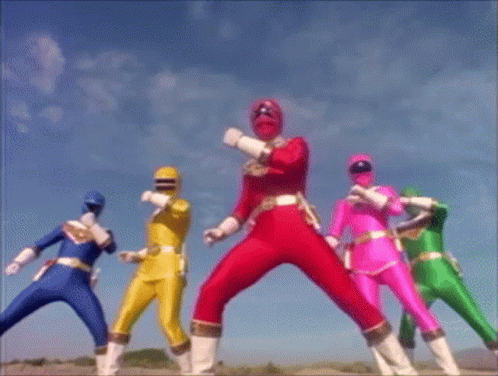

In [64]:
# Code generated by Data Wrangler for pandas sample

from datetime import datetime
import numpy as np
import pandas as pd

def clean_data(pandas_df_pyspark):
    # Replace missing values with "unknow" in columns: 'native-country', 'occupation'
    pandas_df_pyspark = pandas_df_pyspark.fillna({'native-country': "unknow", 'occupation': "unknow"})
    # Replace missing values with the mean of each column in: 'hours-per-week'
    pandas_df_pyspark = pandas_df_pyspark.fillna({'hours-per-week': pandas_df_pyspark['hours-per-week'].mean()})
    # Convert text to lowercase in columns: 'workclass', 'education' and 6 other columns
    pandas_df_pyspark['workclass'] = pandas_df_pyspark['workclass'].str.lower()
    pandas_df_pyspark['education'] = pandas_df_pyspark['education'].str.lower()
    pandas_df_pyspark['marital-status'] = pandas_df_pyspark['marital-status'].str.lower()
    pandas_df_pyspark['occupation'] = pandas_df_pyspark['occupation'].str.lower()
    pandas_df_pyspark['relationship'] = pandas_df_pyspark['relationship'].str.lower()
    pandas_df_pyspark['race'] = pandas_df_pyspark['race'].str.lower()
    pandas_df_pyspark['sex'] = pandas_df_pyspark['sex'].str.lower()
    pandas_df_pyspark['native-country'] = pandas_df_pyspark['native-country'].str.lower()
    # Derive column 'marital_event_year' from column: 'marital_event_date'
    # Transform based on the following examples:
    #    marital_event_date    Output
    # 1: 1954-04-05         => "1954"
    pandas_df_pyspark.insert(7, "marital_event_year", pandas_df_pyspark.apply(lambda row : row["marital_event_date"].strftime("%Y"), axis=1))
    # Derive column 'id_marital_event_date' from column: 'marital_event_date'
    # Transform based on the following examples:
    #    marital_event_date    Output
    # 1: 1954-04-05         => "19540405"
    pandas_df_pyspark.insert(7, "id_marital_event_date", pandas_df_pyspark.apply(lambda row : row["marital_event_date"].strftime("%Y") + row["marital_event_date"].strftime("%m") + row["marital_event_date"].strftime("%d"), axis=1))
    # Derive column 'marital_event_moth_name' from column: 'marital_event_date'
    # Transform based on the following examples:
    #    marital_event_date    Output
    # 1: 1954-04-05         => "April"
    pandas_df_pyspark.insert(7, "marital_event_moth_name", pandas_df_pyspark.apply(lambda row : row["marital_event_date"].strftime("%B"), axis=1))
    # Change column type to int32 for columns: 'id_marital_event_date', 'marital_event_year'
    pandas_df_pyspark = pandas_df_pyspark.astype({'id_marital_event_date': 'int32', 'marital_event_year': 'int32'})
    # Drop columns: 'education', 'citizen_id'
    pandas_df_pyspark = pandas_df_pyspark.drop(columns=['education', 'citizen_id'])
    # Round up column 'hours-per-week'
    pandas_df_pyspark[['hours-per-week']] = np.ceil(pandas_df_pyspark[['hours-per-week']])
    # Scale columns 'hours-per-week', 'capital-loss', 'capital-gain' between 0 and 1
    new_min, new_max = 0, 1
    old_min, old_max = pandas_df_pyspark['hours-per-week'].min(), pandas_df_pyspark['hours-per-week'].max()
    pandas_df_pyspark['hours-per-week'] = (pandas_df_pyspark['hours-per-week'] - old_min) / (old_max - old_min) * (new_max - new_min) + new_min
    old_min, old_max = pandas_df_pyspark['capital-loss'].min(), pandas_df_pyspark['capital-loss'].max()
    pandas_df_pyspark['capital-loss'] = (pandas_df_pyspark['capital-loss'] - old_min) / (old_max - old_min) * (new_max - new_min) + new_min
    old_min, old_max = pandas_df_pyspark['capital-gain'].min(), pandas_df_pyspark['capital-gain'].max()
    pandas_df_pyspark['capital-gain'] = (pandas_df_pyspark['capital-gain'] - old_min) / (old_max - old_min) * (new_max - new_min) + new_min
    # Round columns 'hours-per-week', 'capital-loss', 'capital-gain' (Number of decimals: 3)
    pandas_df_pyspark = pandas_df_pyspark.round({'hours-per-week': 3, 'capital-loss': 3, 'capital-gain': 3})
    # One-hot encode column: 'race'
    insert_loc = pandas_df_pyspark.columns.get_loc('race')
    pandas_df_pyspark = pd.concat([pandas_df_pyspark.iloc[:,:insert_loc], pd.get_dummies(pandas_df_pyspark.loc[:, ['race']]), pandas_df_pyspark.iloc[:,insert_loc+1:]], axis=1)
    # Derive column 'is_female' from column: 'sex'
    def is_female(sex):
        """
        Transform based on the following examples:
           sex         Output
        1: "female" => "1"
        2: "male"   => "0"
        """
        if sex == "male":
            return "0"
        if sex == "female":
            return "1"
        return None
    pandas_df_pyspark.insert(16, "is_female", pandas_df_pyspark.apply(lambda row : is_female(row["sex"]), axis=1))
    return pandas_df_pyspark

# Loaded variable 'df_pyspark' from kernel state
total_rows = df_pyspark.count()
pandas_df_pyspark = df_pyspark.sample(float(min(6000 / total_rows, 1) if total_rows > 0 else 1)).limit(6000).toPandas()

pandas_df_pyspark_clean = clean_data(pandas_df_pyspark.copy())
pandas_df_pyspark_clean.head()

StatementMeta(, 47217876-7033-4f71-b14a-14598a02bb8f, 404, Finished, Available, Finished)

,age,workclass,education-num,marital-status,marital_event_date,marital_event_moth_name,id_marital_event_date,marital_event_year,occupation,relationship,...,race_asian-pac-islander,race_black,race_other,race_white,sex,is_female,capital-gain,capital-loss,hours-per-week,native-country
0,52,self-emp-not-inc,9,married-civ-spouse,2009-01-13,January,20090113,2009,exec-managerial,husband,...,False,False,False,True,male,0,0.000,0.0,0.449,united-states
1,42,private,13,married-civ-spouse,2011-05-10,May,20110510,2011,exec-managerial,husband,...,False,False,False,True,male,0,0.052,0.0,0.408,united-states
2,40,private,16,married-civ-spouse,1972-06-27,June,19720627,1972,prof-specialty,husband,...,False,False,False,True,male,0,0.000,0.0,0.408,united-states
3,35,federal-gov,5,married-civ-spouse,1941-04-02,April,19410402,1941,farming-fishing,husband,...,False,True,False,False,male,0,0.000,0.0,0.398,united-states
4,44,private,14,divorced,1957-12-07,December,19571207,1957,exec-managerial,unmarried,...,False,False,False,True,female,1,0.000,0.0,0.398,united-states


⚠️¡Cuidado! Si nos fijamos en el código anterior, en la línea 73, Data Wrangler ha mantenido la limitación de 6.000 filas y la seleccion aleatoria con el método **sample()**. Además, en la línea 75, hace uso del método **copy()**, esto hace una copia física del DataFrame, lo copia literalmente y genera un objeto nuevo en memoria, si queremos evitarlo debemos quitarlo.

In [65]:
# Code generated by Data Wrangler for PySpark DataFrame

from datetime import datetime
from pyspark.ml.feature import Imputer
from pyspark.ml.feature import MinMaxScaler, VectorAssembler
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml.functions import vector_to_array
from pyspark.sql import functions as F
from pyspark.sql import types as T

def clean_data(df_pyspark):
    # Replace missing values with "unknow" in columns: 'native-country', 'occupation'
    df_pyspark = df_pyspark.fillna(value="unknow", subset=['native-country', 'occupation'])
    # Replace missing values with the mean of each column in: 'hours-per-week'
    cols = ['hours-per-week']
    imputer = Imputer(inputCols=cols, outputCols=cols, strategy='mean')
    df_pyspark = imputer.fit(df_pyspark).transform(df_pyspark)
    # Convert text to lowercase in columns: 'workclass', 'education' and 6 other columns
    df_pyspark = df_pyspark.withColumn('workclass', F.lower(F.col('workclass')))
    df_pyspark = df_pyspark.withColumn('education', F.lower(F.col('education')))
    df_pyspark = df_pyspark.withColumn('marital-status', F.lower(F.col('marital-status')))
    df_pyspark = df_pyspark.withColumn('occupation', F.lower(F.col('occupation')))
    df_pyspark = df_pyspark.withColumn('relationship', F.lower(F.col('relationship')))
    df_pyspark = df_pyspark.withColumn('race', F.lower(F.col('race')))
    df_pyspark = df_pyspark.withColumn('sex', F.lower(F.col('sex')))
    df_pyspark = df_pyspark.withColumn('native-country', F.lower(F.col('native-country')))
    # Derive column 'marital_event_year' from column: 'marital_event_date'
    # Transform based on the following examples:
    #    marital_event_date    Output
    # 1: 1954-04-05         => "1954"
    udf_fn = F.udf(lambda v : v.strftime("%Y"), T.StringType())
    df_pyspark = df_pyspark.withColumn("marital_event_year", udf_fn(F.col("marital_event_date")))
    # Derive column 'id_marital_event_date' from column: 'marital_event_date'
    # Transform based on the following examples:
    #    marital_event_date    Output
    # 1: 1954-04-05         => "19540405"
    udf_fn = F.udf(lambda v : v.strftime("%Y") + v.strftime("%m") + v.strftime("%d"), T.StringType())
    df_pyspark = df_pyspark.withColumn("id_marital_event_date", udf_fn(F.col("marital_event_date")))
    # Derive column 'marital_event_moth_name' from column: 'marital_event_date'
    # Transform based on the following examples:
    #    marital_event_date    Output
    # 1: 1954-04-05         => "April"
    udf_fn = F.udf(lambda v : v.strftime("%B"), T.StringType())
    df_pyspark = df_pyspark.withColumn("marital_event_moth_name", udf_fn(F.col("marital_event_date")))
    # Change column type to int32 for columns: 'id_marital_event_date', 'marital_event_year'
    df_pyspark = df_pyspark.withColumn('id_marital_event_date', df_pyspark['id_marital_event_date'].cast(T.IntegerType()))
    df_pyspark = df_pyspark.withColumn('marital_event_year', df_pyspark['marital_event_year'].cast(T.IntegerType()))
    # Drop columns: 'education', 'citizen_id'
    df_pyspark = df_pyspark.drop('education', 'citizen_id')
    # Round up column 'hours-per-week'
    df_pyspark = df_pyspark.withColumn('hours-per-week', F.ceil(F.col('hours-per-week')))
    # Scale columns 'hours-per-week', 'capital-loss', 'capital-gain' between 0 and 1
    columns_to_scale = ['hours-per-week', 'capital-loss', 'capital-gain']
    assembler = VectorAssembler(inputCols=columns_to_scale, outputCol="__features__", handleInvalid="keep")
    df_pyspark = assembler.transform(df_pyspark)
    scaler = MinMaxScaler(min=0, max=1, inputCol="__features__", outputCol="__scaled_features__")
    df_pyspark = scaler.fit(df_pyspark).transform(df_pyspark)
    df_pyspark = df_pyspark.withColumn("__scaled_features__", vector_to_array("__scaled_features__"))
    df_pyspark = df_pyspark.withColumns({
       columns_to_scale[i]: F.col("__scaled_features__")[i].alias(columns_to_scale[i]) for i in range(len(columns_to_scale))
    })
    df_pyspark = df_pyspark.replace(float('nan'), None, subset=columns_to_scale)
    df_pyspark = df_pyspark.drop("__features__", "__scaled_features__")
    # Round columns 'hours-per-week', 'capital-loss', 'capital-gain' (Number of decimals: 3)
    df_pyspark = df_pyspark.withColumn('hours-per-week', F.round(F.col('hours-per-week'), 3))
    df_pyspark = df_pyspark.withColumn('capital-loss', F.round(F.col('capital-loss'), 3))
    df_pyspark = df_pyspark.withColumn('capital-gain', F.round(F.col('capital-gain'), 3))
    # One-hot encode column: 'race'
    # ⚠️ This was generated to match the original pandas logic but may have performance issues.
    def one_hot_encode_col(df, key):
        insert_idx = df.columns.index(key)
        indexer = StringIndexer(inputCol=key, outputCol='%s_numeric' % str(key), handleInvalid='keep')
        indexer_fitted = indexer.fit(df)
        df_indexed = indexer_fitted.transform(df)
        encoder = OneHotEncoder(inputCols=['%s_numeric' % str(key)], outputCols=['%s_onehot' % str(key)], dropLast=False)
        df_onehot = encoder.fit(df_indexed).transform(df_indexed)
        df_col_onehot = df_onehot.select('*', vector_to_array('%s_onehot' % str(key)).alias('%s_col_onehot' % str(key)))
        labels = sorted(indexer_fitted.labels)
        cols_expanded = [(F.col('%s_col_onehot' % str(key))[i].alias('%s_%s' % (str(key), labels[i]))) for i in range(len(labels))]
        df = df_col_onehot.select(*df.columns[:insert_idx], *cols_expanded, *df.columns[insert_idx+1:])
        return df
    df_pyspark = one_hot_encode_col(df_pyspark, 'race')
    # Derive column 'is_female' from column: 'sex'
    def is_female(sex):
        """
        Transform based on the following examples:
           sex         Output
        1: "female" => "1"
        2: "male"   => "0"
        """
        if sex == "male":
            return "0"
        if sex == "female":
            return "1"
        return None
    udf_fn = F.udf(lambda v : is_female(v), T.StringType())
    df_pyspark = df_pyspark.withColumn("is_female", udf_fn(F.col("sex")))
    return df_pyspark

df_pyspark_clean = clean_data(df_pyspark)
display(df_pyspark_clean)

StatementMeta(, 47217876-7033-4f71-b14a-14598a02bb8f, 405, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, a6fbf12f-49ed-487e-b166-f8955f6c24d5)

Además de limpieza de datos, Data Wrangler también nos puede facilitar el análisis mediante agregaciones. 

⚠️¡Cuidado! El Data Wrangler asignará al los DataFrames resultantes el mismo nombre que antes por lo que al ejecutar la celda se sobreescribirán. Para evitarlo, necesitamos cambiar el nombre del DataFrame donde se almacenará el resultado de la función **clean_data()** en la últimas dos líneas.

In [68]:
# Code generated by Data Wrangler for pandas sample

def clean_data(pandas_df_pyspark):
    # Performed 8 aggregations grouped on columns: 'sex', 'occupation'
    pandas_df_pyspark = pandas_df_pyspark.groupby(['sex', 'occupation']).agg(hoursperweek_mean=('hours-per-week', 'mean'), hoursperweek_min=('hours-per-week', 'min'), hoursperweek_max=('hours-per-week', 'max'), hoursperweek_std=('hours-per-week', 'std'), capitalgain_min=('capital-gain', 'min'), capitalgain_max=('capital-gain', 'max'), capitalgain_mean=('capital-gain', 'mean'), capitalgain_std=('capital-gain', 'std')).reset_index()
    return pandas_df_pyspark

# Loaded variable 'df_pyspark' from kernel state
pandas_df_pyspark = df_pyspark.limit(5000).toPandas()

# pandas_df_pyspark_clean = clean_data(pandas_df_pyspark.copy())
# pandas_df_pyspark_clean.head()
pandas_df_pyspark_agg = clean_data(pandas_df_pyspark.copy())
pandas_df_pyspark_agg.head()

StatementMeta(, 47217876-7033-4f71-b14a-14598a02bb8f, 475, Finished, Available, Finished)

,sex,occupation,hoursperweek_mean,hoursperweek_min,hoursperweek_max,hoursperweek_std,capitalgain_min,capitalgain_max,capitalgain_mean,capitalgain_std
0,Female,Adm-clerical,37.423488,5.0,65.0,8.576672,0.0,20051.0,256.057441,1432.364158
1,Female,Craft-repair,39.000000,20.0,50.0,6.350853,0.0,14344.0,358.600000,2267.985538
2,Female,Exec-managerial,40.882353,10.0,75.0,10.226400,0.0,27828.0,781.712500,3364.246198
3,Female,Farming-fishing,45.250000,38.0,54.0,5.725881,0.0,22040.0,2003.636364,6645.310034
4,Female,Handlers-cleaners,35.294118,7.0,84.0,17.145571,0.0,0.0,0.000000,0.000000


In [69]:
# Code generated by Data Wrangler for PySpark DataFrame

from pyspark.sql import functions as F

def clean_data(df_pyspark):
    # Performed 8 aggregations grouped on columns: 'sex', 'occupation'
    df_pyspark = df_pyspark.groupBy('sex', 'occupation').agg(F.avg('hours-per-week').alias('hoursperweek_mean'), F.min('hours-per-week').alias('hoursperweek_min'), F.max('hours-per-week').alias('hoursperweek_max'), F.stddev('hours-per-week').alias('hoursperweek_std'), F.min('capital-gain').alias('capitalgain_min'), F.max('capital-gain').alias('capitalgain_max'), F.avg('capital-gain').alias('capitalgain_mean'), F.stddev('capital-gain').alias('capitalgain_std'))
    df_pyspark = df_pyspark.dropna()
    df_pyspark = df_pyspark.sort(df_pyspark['sex'].asc(), df_pyspark['occupation'].asc())
    return df_pyspark

# df_pyspark_clean = clean_data(df_pyspark)
# display(df_pyspark_clean)
df_pyspark_agg = clean_data(df_pyspark)
display(df_pyspark_agg)

StatementMeta(, 47217876-7033-4f71-b14a-14598a02bb8f, 476, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 582c8809-7308-43d9-a3e6-e72fbab33864)

# 3. ¡Misión cumplida! 🎉

Data Wrangler es una herramienta que nos ayuda a limpiar y transformar nuestro datos de una forma fácil y aprendiendo código en el proceso. Sin embargo, **no tenemos una opción nativa incluida para guardar el resultado** (solo tenemos el _Save csv_ que vimos en la demo con sus limitaciones). 

Para poder hacerlo, necesitamos hacer uso de código adicional, en concreto código PySpark y el método **write**. 

Este método nos ofrece varias opciones de configuración, entre ellas:
- **format()** -> Indicamos el formato en el que guardar el DataFrame ("CSV", "JSON", "parquet", "delta", etc.).
- **mode()** -> Especificamos qué hacer si los datos de salida ya existen, podemos establecer: error, overwrite, append, ignore, or errorifexists.
- **saveAsTable()** -> Guarda el DataFrame como una tabla delta dentro del Lakehouse con el nombre que especifiquemos. Recordemos que esta demo hemos cargado los datos desde el apartado *Files*, ahora escribiríamos los resultados en *Tables*.
- **save()** -> Guarda el DataFrame como una tabla (precedemos el nombre con el prefijo _Tables/_) o como ficheros (en este caso el prefijo _Files/_), dependiendo de lo que le especifiquemos. Admite tanto el uso de rutas relativas (si tenemos un lakehouse agregado al cuaderno) como absolutas (con o sin lakehouse agregado).

Existen muchas más opciones que podemos encontrar tanto en la [documentación oficial de Fabric](https://learn.microsoft.com/es-es/fabric/data-engineering/lakehouse-notebook-load-data) como en la [documentación oficial de PySpark](https://spark.apache.org/docs/latest/api/python/reference/pyspark.sql/io.html ).

In [71]:
# Escritura a tabla con lakehouse agregado mediante método saveAsTable()
df_pyspark_clean.write.format("delta").mode("overwrite").saveAsTable("census_income_clean")

StatementMeta(, 47217876-7033-4f71-b14a-14598a02bb8f, 478, Finished, Available, Finished)

In [ ]:
# Escritura a tabla con  mediante método save() y especificando el prefijo de /Tables
df_pyspark_agg.write.format("delta").mode("overwrite").save("Tables/hours_week_gain_per_sex_ocuppation")

# 4. Domando a la serpiente 🐍

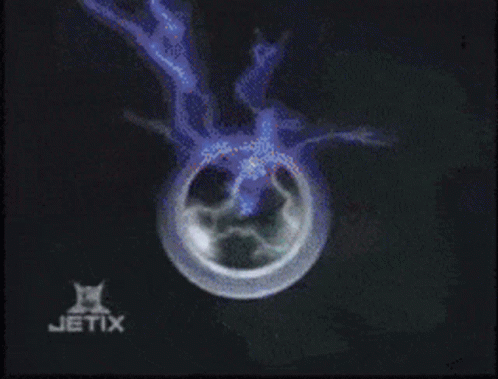

Además de todo lo expuesto anteriormente, nos pueden ser también útiles las siguientes características:
1. **Metamorfosis:** Podemos convertir un DataFrame de pandas a PySpark y viceversa, lo que puede sernos de utilidad dependiendo de lo que vayamos a implementar. </br> ⚠️ No obstante, recordemos que pandas no funciona de forma distribuida como hace Spark y si el dataset es demasiado grande podemos tener problemas de rendimiento. </br> Finalmente como alternativa, contamos con la versión de [pandas-on-spark](https://spark.apache.org/docs/latest/api/python/user_guide/pandas_on_spark/index.html), que unifica lo mejor de ambos mundos aunque cuenta con una compatibilidad de métodos más reducida. </br></br>

1. **Plurilingüe:** Si tenemos experiencia y conocimientos en SQL, ¡nada nos impide poderlos aprovechar! En los cuadernos podemos definir un lenguaje por defecto, entre los cuales está incluido el lenguaje Spark SQL. </br> Por otro lado, aunque el lenguaje del cuaderno sea, por ejemplo, PySpark, podemos activar el uso de SQL en una celda determinada gracias al magic command **%%sql** 🪄

¡Veamos ambos cualidades en acción!

## 4.1 💱**A metamorfosearse**💱
En primer lugar, exploremos como somos capaces de convertir de un tipo de DataFrame a otro (dando lugar a uno nuevo) gracias a los siguientes métodos:
- **toPandas():** Nos permite convertir un DataFrame de Spark a uno de pandas.
- **pandas_api():** Posibilita la conversión de Spark a pandas-on-spark.
- **to_spark():** Convierte un DataFrame de tipo pandas-on-spark a uno de Spark.
- **spark.createDataFrame():** Forma estándar para la creación de DataFrames de Spark, necesitaremos pasarle como argumento el DataFrame de pandas.
- **from_pandas():** Conversión de DataFrame de tipo pandas a tipo pandas-on-spark.
- **to_pandas():** La inversa a la anterior, nos permite pasar de un DataFrame de tipo pandas-on-spark a pandas.

<span style="color:blue">Como añadido especial,</span> <span style="color:red">podemos darle un poco de color al texto</span> <span style="color:green">gracias a la librería</span> [termcolor](https://pypi.org/project/termcolor/).



In [1]:
pip install termcolor

StatementMeta(, b2a8eda7-5fb1-4837-ac0e-4d3c5f4eb478, 3, Finished, Available, Finished)

Note: you may need to restart the kernel to use updated packages.


In [4]:
import os
os.environ['PYARROW_IGNORE_TIMEZONE'] = '1'

import re
import pandas as pd
import pyspark.pandas as ps
from termcolor import colored

# ⚡⬛🟦🟥🟨🟩⚡
def morphin_time(dataframe_name: str, text_color: str, last_call: bool= None) -> None:
    # Establecer variables
    dinozord_type = re.sub("(<class ')|('>)", "", str(type(eval(dataframe_name))))
    morphin_sentence = f"¡Dinozord {dataframe_name} y mi tipo es {dinozord_type}!\n"
    # Impresión de frase final
    print(colored(morphin_sentence, text_color))
    if last_call: print(colored("⚡ GO GO POWER WRANGLERS ⚡\n", attrs=["bold"]))

# Podemos convertir un DataFrame de PySpark 💥 a uno de pandas 🐼
spark_df_base = spark.read.format("csv").option("header","true")\
    .load("Files/census_income.csv")
spark_to_pandas = spark_df_base.toPandas()
morphin_time('spark_to_pandas', 'red')
# Podemos también convertirlo a uno de tipo pandas-on-Spark (antiguo koalas 🐨)
spark_to_koalas = spark_df_base.pandas_api()
morphin_time('spark_to_koalas', 'cyan')
# Que es intercambiable con su homónimo de PySpark 💥
koalas_to_spark = spark_to_koalas.to_spark(index_col='index')
morphin_time('koalas_to_spark', 'light_magenta')
# La conversión también puede hacerse de pandas 🐼 a PySpark 💥
pandas_df_base = pd.read_csv("/lakehouse/default/Files/census_income.csv")
pandas_to_spark = spark.createDataFrame(pandas_df_base)
morphin_time('pandas_to_spark', 'black')
# O a su versión vitaminada en Spark 🐨
pandas_to_koalas = ps.from_pandas(pandas_df_base)
morphin_time('pandas_to_koalas', 'light_yellow', False)
# Finalmente, podemos pasar de pandas-on-spark a pandas 🐼
koalas_to_pandas = pandas_to_koalas.to_pandas()
morphin_time('koalas_to_pandas', 'green', True)

StatementMeta(, b2a8eda7-5fb1-4837-ac0e-4d3c5f4eb478, 6, Finished, Available, Finished)

¡Dinozord spark_to_pandas y mi tipo es pandas.core.frame.DataFrame!

¡Dinozord spark_to_koalas y mi tipo es pyspark.pandas.frame.DataFrame!

¡Dinozord koalas_to_spark y mi tipo es pyspark.sql.dataframe.DataFrame!

¡Dinozord pandas_to_spark y mi tipo es pyspark.sql.dataframe.DataFrame!

¡Dinozord pandas_to_koalas y mi tipo es pyspark.pandas.frame.DataFrame!

¡Dinozord koalas_to_pandas y mi tipo es pandas.core.frame.DataFrame!

⚡ GO GO POWER WRANGLERS ⚡



/opt/spark/python/lib/pyspark.zip/pyspark/pandas/utils.py:1016: PandasAPIOnSparkAdviceWarning: `to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.
  warnings.warn(message, PandasAPIOnSparkAdviceWarning)


## 4.2 ✳️**Spark SQL**✳️

Por lo que respecta a poder utilizar SQL, podemos realizar consultas vía Spark SQL sobre un DataFrame haciendo uso de parámetros, lo que puede ser útil para dinamizar.

Además, el contenido de la consulta puede almacenarse dentro de un DataFrame si así lo necesitamos, por ejemplo para guardar los resultados obtenidos.

In [ ]:
# Creamos todo lo necesario para nuestro DataFrame
rangers_data = [("Jason", "Red ranger"), ("Kimberly", "Pink ranger"), ("Zack", "Black ranger"), ("Trini", "Yellow ranger"), ("Billy", "Blue ranger")]
rangers_schema = "Name STRING, Color STRING"
rangers_df = spark.createDataFrame(rangers_data, rangers_schema)
# Almacenamos el resultado de la consulta parametrizada en otro DataFrame
rangers_sql = spark.sql("SELECT {field1}, {field2} FROM {source_df}",\
    source_df = rangers_df,\
    field1 = rangers_df["Name"],\
    field2 = rangers_df["Color"])
# Mostramos los resultados
display(rangers_sql)

StatementMeta(, , , Waiting, , Waiting)

SynapseWidget(Synapse.DataFrame, 81e738a0-027a-49c2-a7f8-df897f292748)

Podemos también convertir un DataFrame en una vista temporal y consultarlo desde PySpark 💥.

In [ ]:
# Creamos una vista temporal empleando el DataFrame previamente creado
tmp_view_name = "pbidays_wranglers_view"
rangers_df.createOrReplaceTempView(tmp_view_name)
# Mostramos el contenido de la vista, referenciando el nombre asignado dentro de la variable
display(spark.sql(f"SELECT * FROM {tmp_view_name}"))

StatementMeta(, , , Waiting, , Waiting)

SynapseWidget(Synapse.DataFrame, 3288a115-12cb-4cbe-8762-7dcd545e66b5)

O directamente desde Spark SQL, lenguaje que podemos utilizar en la celda gracias al magic command **%%sql**.

⚠️ Tengamos en cuenta que será necesario haber creado la vista temporal previamente tal como hemos hecho en la celda anterior, gracias al método **createOrReplaceTempView()**.

In [ ]:
%%sql
-- Consultamos directamente la vista una vez creada en Spark SQL mediante magic command
SELECT * FROM pbidays_wranglers_view

StatementMeta(, , , Waiting, , Waiting)

<Spark SQL result set with 5 rows and 2 fields>